In [ ]:
import Pkg
Pkg.add("DynamicPolynomials")
Pkg.add("SumOfSquares")
Pkg.add("CSDP")
Pkg.add("JuMP")
Pkg.add("SCS")
Pkg.add("PyPlot")
Pkg.build("PyPlot")
Pkg.add("Contour")

   Resolving package versions...
     Project No packages added to or removed from `~/.julia/environments/v1.12/Project.toml`
    Manifest No packages added to or removed from `~/.julia/environments/v1.12/Manifest.toml`
   Resolving package versions...
     Project No packages added to or removed from `~/.julia/environments/v1.12/Project.toml`
    Manifest No packages added to or removed from `~/.julia/environments/v1.12/Manifest.toml`
   Resolving package versions...
     Project No packages added to or removed from `~/.julia/environments/v1.12/Project.toml`
    Manifest No packages added to or removed from `~/.julia/environments/v1.12/Manifest.toml`
   Resolving package versions...
     Project No packages added to or removed from `~/.julia/environments/v1.12/Project.toml`
    Manifest No packages added to or removed from `~/.julia/environments/v1.12/Manifest.toml`
   Resolving package versions...
     Project No packages added to or removed from `~/.julia/environments/v1.12/Project.

## Setup and Sum-of-Squares Decomposition Demonstration

This cell demonstrates the basic usage of the `SumOfSquares` package. It defines a polynomial `p` and then uses the SOS (Sum-of-Squares) programming formulation to check if `p` is non-negative. If `p` is indeed SOS, the solver finds an explicit decomposition.

In [ ]:
using DynamicPolynomials
using SumOfSquares
import CSDP
using Printf

# 1. Define polynomial variables and polynomial
@polyvar x y
p = x^2 - x*y^2 + y^4 + 1

# 2. Create the SOS model
model = SOSModel(CSDP.Optimizer)

# 3. Add constraint
@constraint(model, cref, p >= 0)

# 4. Solve feasibility problem
optimize!(model)

# 5. Extract Gram Matrix and Basis Monomials
gram = gram_matrix(cref)
Q = Matrix(gram.Q)              # Numeric Gram Matrix
basis = collect(gram.basis)   # Monomial basis vector v(x)

println("="^40)
println("1. MONOMIAL BASIS v(x):")
println("="^40)
for (i, m) in enumerate(basis)
    println("  [$i] $m")
end

println("\n" * "="^40)
println("2. GRAM MATRIX Q (Rounded to 2 decimals):")
println("="^40)
# Print matrix row-by-row with formatted floats
for i in 1:size(Q, 1)
    row_str = join([@sprintf("%6.2f", Q[i, j]) for j in 1:size(Q, 2)], " ")
    println(row_str)
end



CSDP 6.2.0
This is a pure primal feasibility problem.
Iter:  0 Ap: 0.00e+00 Pobj:  0.0000000e+00 Ad: 0.00e+00 Dobj:  0.0000000e+00 
Iter:  1 Ap: 9.00e-01 Pobj:  0.0000000e+00 Ad: 1.00e+00 Dobj:  2.7659722e+01 
Iter:  2 Ap: 1.00e+00 Pobj:  0.0000000e+00 Ad: 1.00e+00 Dobj:  1.2562719e+01 
1. MONOMIAL BASIS v(x):
  [1] 1
  [2] y
  [3] x
  [4] y^2

2. GRAM MATRIX Q (Rounded to 2 decimals):
  1.00   0.00   0.00  -0.63
  0.00   1.25   0.00   0.00
  0.00   0.00   1.00  -0.50
 -0.63   0.00  -0.50   1.00
Success: SDP solved
Primal objective value: 0.0000000e+00 
Dual objective value: 0.0000000e+00 
Relative primal infeasibility: 3.29e-17 
Relative dual infeasibility: 5.00e-11 
Real Relative Gap: 0.00e+00 
XZ Relative Gap: 1.06e-10 
DIMACS error measures: 4.93e-17 0.00e+00 5.00e-11 0.00e+00 0.00e+00 1.06e-10


Consider $\dot x = f(x) + u$, with:

1. $f(x) = 2\sin(x) + \cos(x)$

2. $f(x) = x^3$

3. $f(x) = x^5$

4. $f(x) = x + x^3$

5. $f(x) = x + x^2$

6. $f(x) = x + \sin(x)$

7. $f(x) = 2\tan^{-1}(x)$

8. $f(x) = 2x - x^5$

9. $f(x) = x - x^3$

10. $f(x) = \sin(x)$

11. $f(x) = \frac{x}{1+x^2}$

12. $f(x) = e^x - 1$

Find $u = g(x)$ that makes a fixed point $x^\star$ stable and prove it.

Plot solve the system using solve_ivp and plot the solution. Example of how to use solve_ivp and plot the solution is below:

Find Lyapunov function that proves local stability.

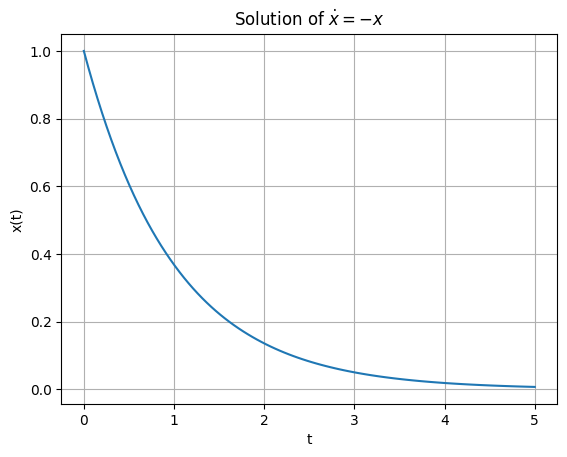

In [ ]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

# Define the ODE: dx/dt = -x
def ode(t, x):
    return -x

# Solve from t=0 to t=5, with initial condition x(0)=1
sol = solve_ivp(ode, (0, 5), [1.0], t_eval=np.linspace(0, 5, 100))

# Plot the solution
plt.plot(sol.t, sol.y[0])
plt.xlabel('t')
plt.ylabel('x(t)')
plt.title(r'Solution of $\dot{x} = -x$')
plt.grid(True)
plt.show()

## Lyapunov Function Search

This cell searches for a quadratic Lyapunov function `V(x)` for a given dynamical system `dx/dt = f(x)`. It sets up an SOS program with constraints to ensure `V(x)` is positive definite and its time derivative `dV/dt` is negative definite (specifically, `-dV/dt >= alpha * V`) to prove global exponential stability. The problem is solved using the `CSDP` optimizer.

In [ ]:
using DynamicPolynomials
using SumOfSquares
using CSDP
using LinearAlgebra # for dot

# Define polynomial variables
@polyvar x[1:2]

# The polynomial vector field: dx/dt = f(x)
f = [-x[1]^3-x[1], -x[2]]
# f = [-x[1]^3, -x[2]]

# Initialize the SOS model with a solver (CSDP is a classic open-source SDP solver)
solver = optimizer_with_attributes(CSDP.Optimizer, MOI.Silent() => true)
model = SOSModel(solver)

# We search for a Lyapunov function of the form V(x) = p1*x1^2 + p2*x2^2.
# We use a helper variable to enforce V >= epsilon * ||x||^2.
monos = x.^2
@variable(model, V, Poly(monos))

# --- Constraint 1: Positive Definiteness of V ---
# Enforce V(x) >= epsilon * (x1^2 + x2^2) with epsilon = 1.
# This ensures V is positive definite (and radially unbounded).
epsilon = 1.0
@constraint(model, V >= epsilon * sum(x.^2))

# Compute the time derivative of V along the flow: dV/dt = (dV/dx) * f
dVdt = dot(differentiate(V, x), f)

# --- Constraint 2: Negative Definiteness of dV/dt ---
# For GLOBAL ASYMPTOTIC STABILITY, uncomment the line below:
# @constraint(model, -dVdt in SOSCone())
# This enforces dV/dt <= 0 (negative semidefinite), which proves global asymptotic stability.

# For GLOBAL EXPONENTIAL STABILITY, we use the line below instead:
# We enforce -dV/dt >= alpha * V for some alpha > 0.
# Here we pick alpha = 1 to avoid extra search variables (we can always scale time).
alpha = 1.0
@constraint(model, -dVdt >= alpha * V)

# --- Solve the SOS Program ---
optimize!(model)

# Check if the solver found a feasible solution
println("Termination status: ", termination_status(model))
if primal_status(model) == MOI.FEASIBLE_POINT
    println("Found Lyapunov function V(x) = ", value(V))
    println("This certifies global exponential stability (with rate alpha = $alpha).")
else
    println("No certificate found with this degree/monomial basis.")
end

Termination status: OPTIMAL
Found Lyapunov function V(x) = 11.115091071242766·x[2]^2 + 7.469075442336052·x[1]^2
This certifies global exponential stability (with rate alpha = 1.0).


## Visualization of Lyapunov Surfaces

This cell visualizes the found Lyapunov function `V(x)` and its time derivative `dV/dt` over a 2D grid. It plots the surfaces `V(x)` and `dV/dt` (along with `-alpha * V(x)`) to graphically illustrate the stability conditions. The `PyPlot` backend is used for 3D surface plotting

Lyapunov function: V(x) = 11.115091071242766·x[2]^2 + 7.469075442336052·x[1]^2
Time derivative:   Vdot(x) = -22.230182142485532*x[2]^2 - 14.938150884672105*x[1]^2 - 14.938150884672105*x[1]^4
V  along x2=0: [29.88083807832135, 28.68590793919443, 27.515364129437447, 26.36920664905041, 25.2474354980333, 24.15005067638613, 23.077052184108894, 22.028440021201597, 21.004214187664235, 20.00437468349682, 19.028921508699334, 18.077854663271786, 17.151174147214174, 16.2488799605265, 15.370972103208766, 14.51745057526097, 13.688315376683109, 12.883566507475182, 12.103203967637194, 11.347227757169144, 10.615637876071029, 9.908434324342855, 9.225617101984616, 8.567186208996311, 7.9331416453779475, 7.32348341112952, 6.738211506251028, 6.177325930742474, 5.6408266846038595, 5.128713767835179, 4.640987180436436, 4.177646922407632, 3.738692993748763, 3.3241253944598323, 2.933944124540839, 2.568149183991782, 2.2267405728126617, 1.9097182910034798, 1.617082338564234, 1.348832715494926, 1.1049694217955544

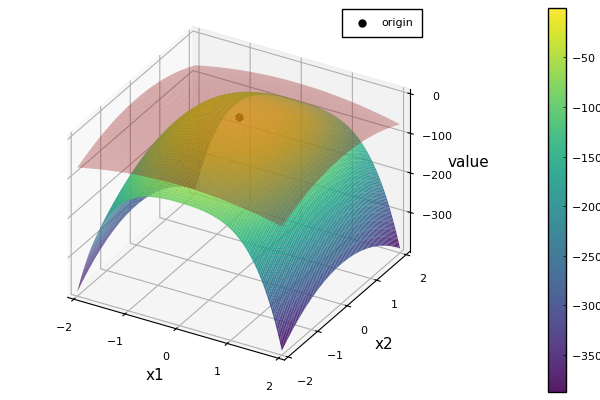

<sys>:0: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
<sys>:0: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
<sys>:0: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
<sys>:0: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
<sys>:0: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


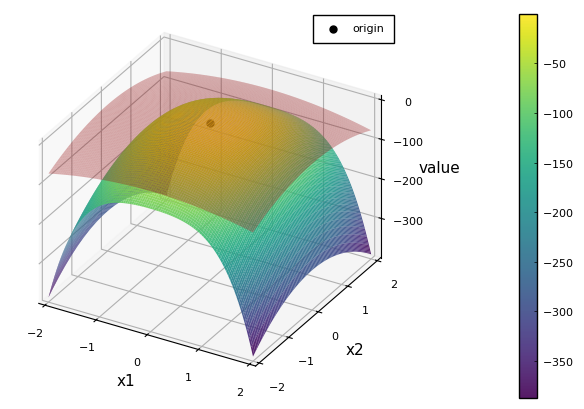

"/content/lyapunov_surfaces_pyplot.png"

In [ ]:
using DynamicPolynomials
using SumOfSquares
using CSDP
using LinearAlgebra
using Plots
pyplot()   # <-- use the matplotlib-backed PyPlot backend

# ---------- 1. Set up and solve the SOS program ----------
@polyvar x[1:2]
f = [-x[1]^3 - x[1], -x[2]]

monos = x.^2
solver = optimizer_with_attributes(CSDP.Optimizer, MOI.Silent() => true)
model = SOSModel(solver)

@variable(model, V, Poly(monos))
epsilon = 1.0
@constraint(model, V >= epsilon * sum(x.^2))

dVdt = dot(differentiate(V, x), f)

alpha = 1.0
@constraint(model, -dVdt >= alpha * V)

optimize!(model)
@assert primal_status(model) == MOI.FEASIBLE_POINT "No certificate found."

V_sol    = value(V)
dVdt_sol = dot(differentiate(V_sol, x), f)

println("Lyapunov function: V(x) = ", V_sol)
println("Time derivative:   Vdot(x) = ", dVdt_sol)

# ---------- 2. Build the numerical grid, one point at a time ----------
n = 100
xs = range(-2.0, 2.0, length = n)
ys = range(-2.0, 2.0, length = n)

X    = zeros(Float64, n, n)
Y    = zeros(Float64, n, n)
Vg   = zeros(Float64, n, n)
Vdg  = zeros(Float64, n, n)
negV = zeros(Float64, n, n)

for i in 1:n
    for j in 1:n
        xi = xs[i]
        yi = ys[j]

        X[i, j] = xi
        Y[i, j] = yi

        v_val  = V_sol(x[1] => xi, x[2] => yi)
        vd_val = dVdt_sol(x[1] => xi, x[2] => yi)

        Vg[i, j]   = v_val
        Vdg[i, j]  = vd_val
        negV[i, j] = -alpha * v_val
    end
end

# ---------- 3. Sanity check on the x2 = 0 slice ----------
j0 = argmin(abs.(ys .- 0.0))
println("V  along x2=0: ", Vg[:, j0])
println("Vd along x2=0: ", Vdg[:, j0])

# ---------- 4. Plot with PyPlot backend ----------
p = plot(
    X, Y, Vdg,
    st      = :surface,
    camera  = (30, 30),
    xlabel  = "x1",
    ylabel  = "x2",
    zlabel  = "value",
    label   = "Vdot(x)",
    alpha   = 0.9,
    color   = :viridis,
    linealpha = 0,          # hide mesh lines for a cleaner surface
)

plot!(
    p, X, Y, negV,
    st      = :surface,
    label   = "-alpha * V(x)",
    alpha   = 0.35,
    color   = :reds,
    linealpha = 0,
)

# Mark the origin explicitly as a single point.
scatter!(p, [0.0], [0.0], [0.0],
         markersize = 5, color = :black, label = "origin")

display(p)
savefig(p, "lyapunov_surfaces_pyplot.png")

Status: ALMOST_OPTIMAL
Feasible S-procedure certificate found (Status: ALMOST_OPTIMAL).
λ(x) = 1.2428559157410746·1 + 1.4779288903810084e-12·x[2] + 4.320099833421409e-12·x[1] - 0.09694128961672277·x[2]^2 + 4.490630090003833e-12·x[1]*x[2] + 0.35666196214236834·x[1]^2 - 9.094947017729282e-13·x[2]^3 - 3.0127011996228248e-12·x[1]*x[2]^2 + 1.8189894035458565e-12·x[1]^2*x[2] + 5.115907697472721e-12·x[1]^3 + 0.006677223375845642·x[2]^4 + 1.5347723092418164e-12·x[1]*x[2]^3 - 0.016968610627088765·x[1]^2*x[2]^2 - 3.467448550509289e-12·x[1]^3*x[2] + 0.02404401322223748·x[1]^4 + 5.684341886080802e-14·x[2]^5 + 1.7053025658242404e-13·x[1]*x[2]^4 - 3.410605131648481e-13·x[1]^2*x[2]^3 + 2.2737367544323206e-13·x[1]^3*x[2]^2 + 3.410605131648481e-13·x[1]^4*x[2] - 0.00015390782368740474·x[2]^6 - 3.979039320256561e-13·x[1]*x[2]^5 + 0.00014831340911314328·x[1]^2*x[2]^4 + 8.526512829121202e-13·x[1]^3*x[2]^3 + 9.759609361026378e-5·x[1]^4*x[2]^2 - 3.410605131648481e-13·x[1]^5*x[2] - 0.00028134593492268323·x[1]

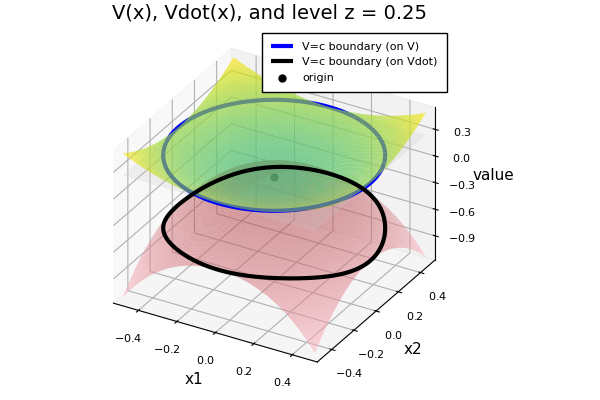

<sys>:0: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
<sys>:0: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
<sys>:0: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
<sys>:0: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
<sys>:0: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


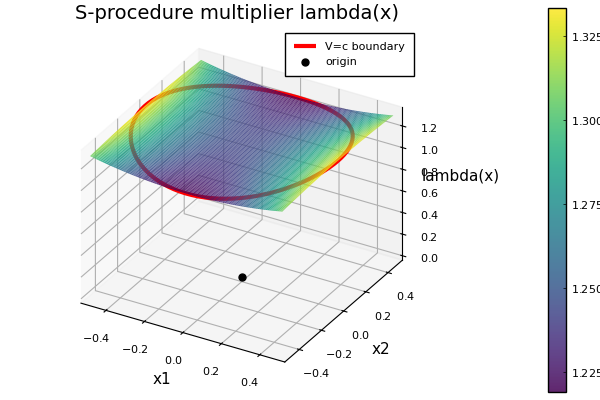

<sys>:0: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
<sys>:0: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
<sys>:0: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
<sys>:0: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
<sys>:0: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


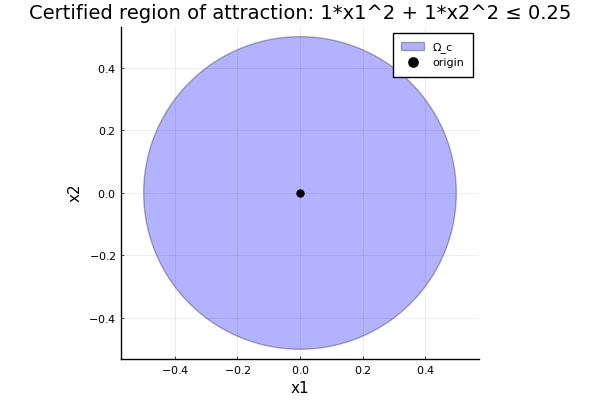

In [ ]:


# Cell 2: SOS stability certificate
using DynamicPolynomials
using SumOfSquares
using JuMP
using SCS      # free solver
using CSDP

# ---------------------------------------------------------------
# 1. Polynomial system  xdot = f(x)
# ---------------------------------------------------------------
@polyvar x[1:2]
vars = x

# Example: reversed-time Van der Pol
#f = [-x[1], -x[2]]
f = [-x[1]^3-x[1], -x[2]]
# Example: reversed-time Van der Pol
#f = [ -x[1] + 2*x[1]^2*x[2],
#      -x[2] ]

# ---------------------------------------------------------------
# 2. Lyapunov function candidate (fixed, known positive definite)
# ---------------------------------------------------------------
k_1 = 1
k_2 = 1
V = k_1 * x[1]^2 + k_2 * x[2]^2

# ---------------------------------------------------------------
# 3. Vdot = grad V · f
# ---------------------------------------------------------------
Vdot = sum(differentiate(V, x[i]) * f[i] for i in 1:2)

# ---------------------------------------------------------------
# 4. Fixed sublevel set value c  (no bisection here)
# ---------------------------------------------------------------
c = 0.25    # region Ω_c = { V(x) ≤ c }

# ---------------------------------------------------------------
# 5. SOS program with free solver (SCS or CSDP)
# ---------------------------------------------------------------
model = SOSModel(CSDP.Optimizer)
set_silent(model)
# SCS is a first-order solver; tighten tolerances a bit for SOS feasibility
#set_optimizer_attribute(model, "eps_abs", 1e-7)
#set_optimizer_attribute(model, "eps_rel", 1e-7)
#set_optimizer_attribute(model, "max_iters", 100_000)

# S-procedure multiplier λ(x) ≥ 0, SOS
deg_lambda = 10
@variable(model, lambda_poly, Poly(monomials(x, 0:deg_lambda)))
@constraint(model, lambda_poly in SOSCone())

# Main S-procedure / Positivstellensatz constraint:
#   -Vdot + λ (c - V) - ε ||x||²  ∈ SOS
epsilon = 1e-6
sos_expr = -Vdot + lambda_poly * (c - V) - epsilon * sum(x.^2)
@constraint(model, sos_expr in SOSCone())

# ---------------------------------------------------------------
# 6. Solve
# ---------------------------------------------------------------
optimize!(model)
println("Status: ", termination_status(model))

# ---------------------------------------------------------------
# 7. Report the certificate
# ---------------------------------------------------------------
status = termination_status(model)
acceptable_statuses = (
    MOI.OPTIMAL,
    MOI.ALMOST_OPTIMAL,
    MOI.LOCALLY_SOLVED,
    MOI.ALMOST_LOCALLY_SOLVED
)

if status in acceptable_statuses
    λ_val = value(lambda_poly)
    println("Feasible S-procedure certificate found (Status: ", status, ").")
    println("λ(x) = ", λ_val)
    println("Region certified: V(x) ≤ ", c)
else
    println("No certificate at c = ", c, " (Status: ", status, ")")
    println("Try a smaller c or higher-degree λ.")
end


# Cell 3: Visualization of V, Vdot, lambda (with hardcoded ellipse boundary)
using Plots
pyplot()

# ---------------------------------------------------------------
# 1. Pull out the solved objects
# ---------------------------------------------------------------
V_sol      = V                    # fixed Lyapunov candidate
dVdt_sol   = Vdot                 # fixed derivative
lambda_sol = value(lambda_poly)   # solved S-procedure multiplier

# ---------------------------------------------------------------
# 2. Build the numerical grid
# ---------------------------------------------------------------
n = 100
display_range = 0.5
xs = range(-display_range, display_range, length = n)
ys = range(-display_range, display_range, length = n)

X    = zeros(Float64, n, n)
Y    = zeros(Float64, n, n)
Vg   = zeros(Float64, n, n)
Vdg  = zeros(Float64, n, n)
Lg   = zeros(Float64, n, n)
Cg   = zeros(Float64, n, n)   # flat plane z = c

for i in 1:n
    for j in 1:n
        xi = xs[i]
        yi = ys[j]

        X[i, j] = xi
        Y[i, j] = yi

        Vg[i, j]  = V_sol(x[1] => xi, x[2] => yi)
        Vdg[i, j] = dVdt_sol(x[1] => xi, x[2] => yi)
        Lg[i, j]  = lambda_sol(x[1] => xi, x[2] => yi)
        Cg[i, j]  = c
    end
end

# ---------------------------------------------------------------
# 3. Hardcoded ellipse boundary:  k1*x1^2 + k2*x2^2 = c
#    => x1 = sqrt(c/k1)*cos(theta),  x2 = sqrt(c/k2)*sin(theta)
# ---------------------------------------------------------------
theta = range(0, 2π, length = 200)
xc = sqrt(c / k_1) .* cos.(theta)
yc = sqrt(c / k_2) .* sin.(theta)

# Evaluate each surface's z-value exactly along the ellipse
zc_V  = [V_sol(x[1] => xi, x[2] => yi)      for (xi, yi) in zip(xc, yc)]  # ≈ c everywhere
zc_Vd = [dVdt_sol(x[1] => xi, x[2] => yi)   for (xi, yi) in zip(xc, yc)]
zc_L  = [lambda_sol(x[1] => xi, x[2] => yi) for (xi, yi) in zip(xc, yc)]

# ---------------------------------------------------------------
# 4. Combined plot: V(x), Vdot(x), flat plane z = c, and the ellipse
# ---------------------------------------------------------------
p1 = plot(
    X, Y, Vg,
    st        = :surface,
    camera    = (30, 30),
    xlabel    = "x1", ylabel = "x2", zlabel = "value",
    title     = "V(x), Vdot(x), and level z = $c",
    label     = "V(x)",
    color     = :viridis,
    alpha     = 0.75,
    linealpha = 0,
    colorbar  = false,
)

plot!(
    p1, X, Y, Vdg,
    st        = :surface,
    label     = "Vdot(x)",
    color     = :reds,
    alpha     = 0.55,
    linealpha = 0,
)

plot!(
    p1, X, Y, Cg,
    st        = :surface,
    label     = "z = c",
    color     = :grays,
    alpha     = 0.25,
    linealpha = 0,
)

# Ellipse traced on the V(x) surface (should sit right at height c)
plot!(p1, xc, yc, zc_V, lw = 3, color = :blue, label = "V=c boundary (on V)")
# Same ellipse traced on the Vdot(x) surface (check sign along boundary)
plot!(p1, xc, yc, zc_Vd, lw = 3, color = :black, label = "V=c boundary (on Vdot)")

scatter!(p1, [0.0], [0.0], [0.0],
         markersize = 5, color = :black, label = "origin")

display(p1)
savefig(p1, "V_Vdot_c_surfaces.png")

# ---------------------------------------------------------------
# 5. Separate plot: lambda(x) with ellipse boundary
# ---------------------------------------------------------------
p2 = plot(
    X, Y, Lg,
    st        = :surface,
    camera    = (30, 30),
    xlabel    = "x1", ylabel = "x2", zlabel = "lambda(x)",
    title     = "S-procedure multiplier lambda(x)",
    color     = :viridis,
    alpha     = 0.85,
    linealpha = 0,
    colorbar  = true,
)

plot!(p2, xc, yc, zc_L, lw = 3, color = :red, label = "V=c boundary")

scatter!(p2, [0.0], [0.0], [0.0],
         markersize = 5, color = :black, label = "origin")

display(p2)
savefig(p2, "lambda_surface.png")

# ---------------------------------------------------------------
# 6. Bonus: flat 2D view of the region of attraction (no 3D needed)
# ---------------------------------------------------------------
p3 = plot(
    xc, yc,
    seriestype = :shape,
    xlabel = "x1", ylabel = "x2",
    title  = "Certified region of attraction: $(k_1)*x1^2 + $(k_2)*x2^2 ≤ $c",
    label  = "Ω_c",
    alpha  = 0.3,
    color  = :blue,
    aspect_ratio = :equal,
)
scatter!(p3, [0.0], [0.0], color = :black, markersize = 5, label = "origin")
display(p3)
savefig(p3, "region_of_attraction_2D.png")
